In [2]:
## tutorial: https://stereopy.readthedocs.io/en/latest/Tutorials/clustering.html#
import stereo as st
import os
import re

os.chdir('/scratch/u/qqiu/project/multiomics/stereo_seq/result/')

2023-03-01 13:22:18.279790: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [3]:
gef = '952BR_B4/04.tissuecut/SS200000952BR_B4.tissue.gef'
#st.io.read_gef_info(E4_gef)

In [4]:
data = st.io.read_gef(file_path=gef, bin_size=50)
adata = st.io.stereo_to_anndata(data, flavor='seurat', output='952BR_B4.bin50.h5ad')

[2023-03-01 13:22:41][Stereo][4136][139898204899136][reader][518][INFO]: read_gef begin ...
[2023-03-01 13:22:46][Stereo][4136][139898204899136][reader][591][INFO]: the matrix has 80134 cells, and 17495 genes.
[2023-03-01 13:22:46][Stereo][4136][139898204899136][reader][599][INFO]: read_gef end.
[2023-03-01 13:22:46][Stereo][4136][139898204899136][reader][324][INFO]: Adding sample in adata.obs['orig.ident'].
[2023-03-01 13:22:46][Stereo][4136][139898204899136][reader][327][INFO]: Adding data.position as adata.obsm['spatial'] .
[2023-03-01 13:22:46][Stereo][4136][139898204899136][reader][330][INFO]: Adding data.position as adata.obs['x'] and adata.obs['y'] .
[2023-03-01 13:22:46][Stereo][4136][139898204899136][reader][416][INFO]: Rename QC info.
[2023-03-01 13:22:46][Stereo][4136][139898204899136][reader][432][INFO]: Finished conversion to anndata.
[2023-03-01 13:22:47][Stereo][4136][139898204899136][reader][436][INFO]: Finished output to 952BR_B4.bin50.h5ad


In [5]:
adata.write_csvs("952BR_B4.obs", skip_data=False)

writing .csv files to 952BR_B4.obs


[2023-02-03 14:01:01][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run cal_qc...
[2023-02-03 14:01:01][Stereo][57183][140316455438144][st_pipeline][43][INFO]: cal_qc end, consume time 0.1996s.


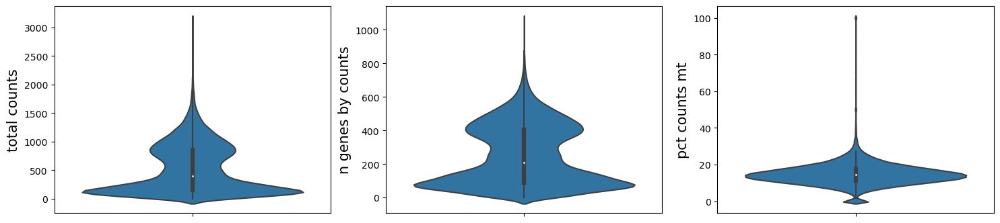

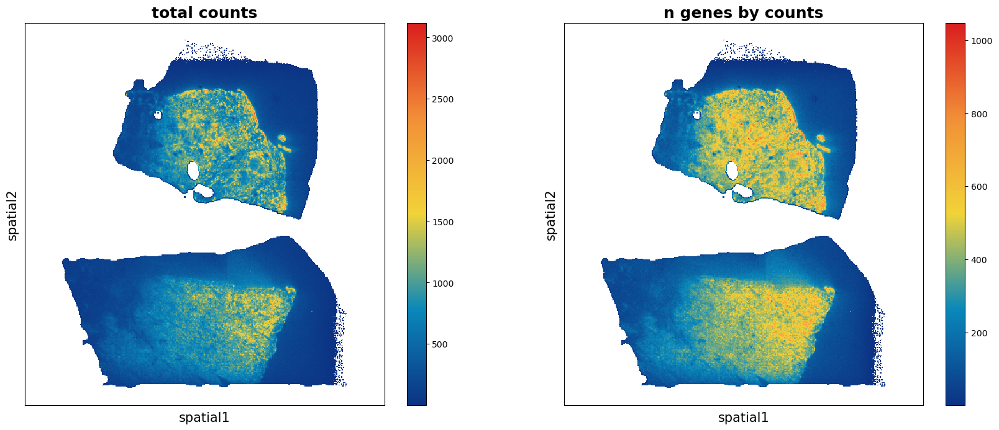

In [4]:
## quality control
data.tl.cal_qc()
data.plt.violin()
data.plt.spatial_scatter()

In [5]:
pattern = re.compile(r'^Rp[Sl]\d+|^Ig|^[Mm]t-')
black_gene_list = [i for i in data.gene_names if pattern.search(i)]
remain_gene_list = [i for i in data.gene_names if i not in black_gene_list]
len(remain_gene_list)

17399

In [6]:
## filtering
data.tl.filter_cells(min_gene=50, min_n_genes_by_counts=3, pct_counts_mt=30, inplace=True)
data.tl.filter_genes(min_cell=3, gene_list=remain_gene_list, inplace=True)
data.exp_matrix.shape

[2023-02-03 14:01:05][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run filter_cells...
[2023-02-03 14:01:06][Stereo][57183][140316455438144][st_pipeline][43][INFO]: filter_cells end, consume time 0.6669s.
[2023-02-03 14:01:06][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run filter_genes...
[2023-02-03 14:01:07][Stereo][57183][140316455438144][st_pipeline][43][INFO]: filter_genes end, consume time 0.9735s.


(74884, 16354)

In [7]:
## normalization
data.tl.raw_checkpoint() # save raw exp_matrix

#data.tl.sctransform(n_genes=2000, res_key="sct")
#data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3,min_disp=0.5,
#                              n_top_genes=2000, res_key='hvg_sct')
#data.plt.highly_variable_genes(res_key='hvg_sct')

[2023-02-03 14:01:07][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run normalize_total...
[2023-02-03 14:01:07][Stereo][57183][140316455438144][st_pipeline][43][INFO]: normalize_total end, consume time 0.3874s.
[2023-02-03 14:01:07][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run log1p...
[2023-02-03 14:01:08][Stereo][57183][140316455438144][st_pipeline][43][INFO]: log1p end, consume time 0.1351s.
[2023-02-03 14:01:08][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run highly_variable_genes...
[2023-02-03 14:01:08][Stereo][57183][140316455438144][st_pipeline][43][INFO]: highly_variable_genes end, consume time 0.7407s.


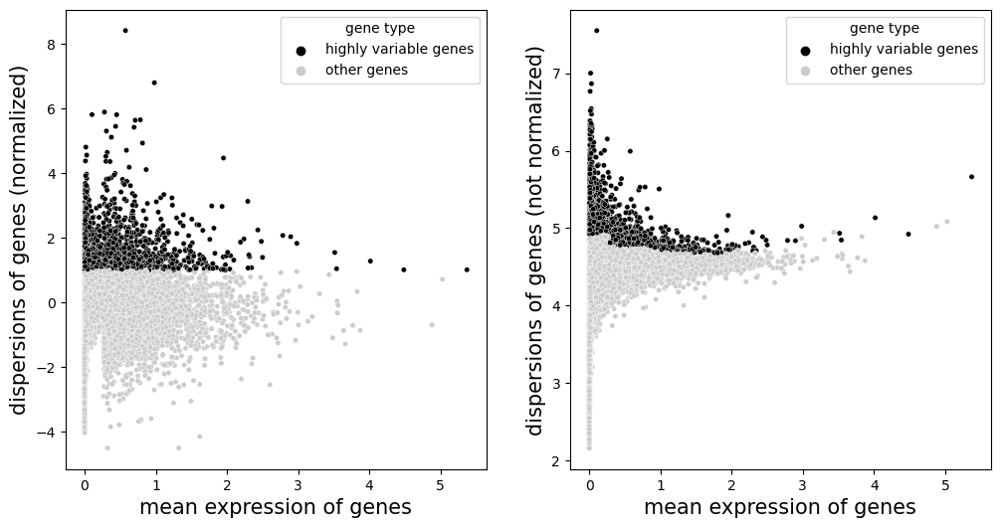

In [8]:
data.tl.normalize_total(target_sum=10000, res_key="nt")
data.tl.log1p(res_key="log1p")

data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3,min_disp=0.5,
                              n_top_genes=2000, res_key='hvg_nt')
data.plt.highly_variable_genes(res_key='hvg_nt')

In [9]:
data.tl.scale(max_value=10, zero_center=True)
data.tl.pca(use_highly_genes=True, n_pcs=20, res_key='pca', hvg_res_key="hvg_nt")
data.tl.neighbors(pca_res_key='pca', n_pcs=20, res_key='neighbors', n_jobs=6)
data.tl.umap(pca_res_key='pca', neighbors_res_key='neighbors', res_key='umap')

[2023-02-03 14:01:09][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run scale...
[2023-02-03 14:01:19][Stereo][57183][140316455438144][scale][52][INFO]: Truncate at max_value 10
[2023-02-03 14:01:21][Stereo][57183][140316455438144][st_pipeline][43][INFO]: scale end, consume time 11.6992s.
[2023-02-03 14:01:21][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run pca...
[2023-02-03 14:01:31][Stereo][57183][140316455438144][st_pipeline][43][INFO]: pca end, consume time 10.4627s.
[2023-02-03 14:01:31][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run neighbors...
[2023-02-03 14:01:57][Stereo][57183][140316455438144][st_pipeline][43][INFO]: neighbors end, consume time 25.9936s.
[2023-02-03 14:01:57][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run umap...


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


[2023-02-03 14:02:31][Stereo][57183][140316455438144][st_pipeline][43][INFO]: umap end, consume time 33.4363s.


[2023-02-03 14:02:31][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run louvain...
[2023-02-03 14:02:31][Stereo][57183][140316455438144][_louvain][99][INFO]:     using the "louvain" package of Traag (2017)
[2023-02-03 14:02:41][Stereo][57183][140316455438144][st_pipeline][43][INFO]: louvain end, consume time 10.4287s.


<AxesSubplot:title={'center':'louvain_0.3'}, xlabel='umap1', ylabel='umap2'>

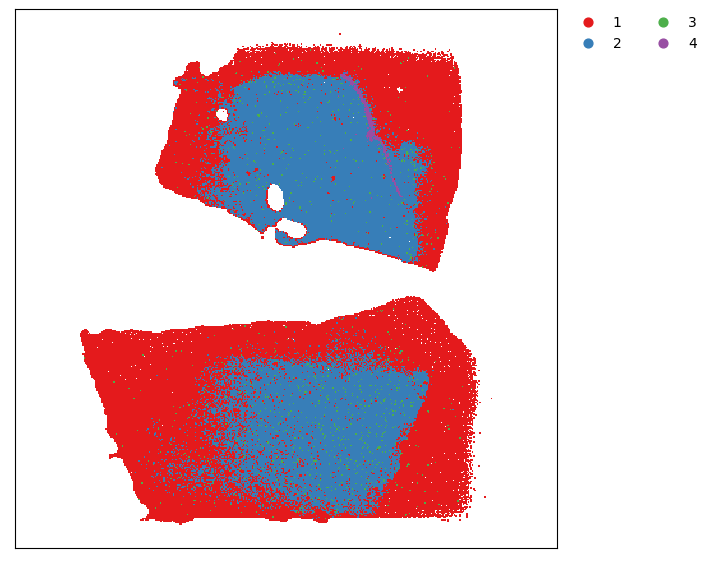

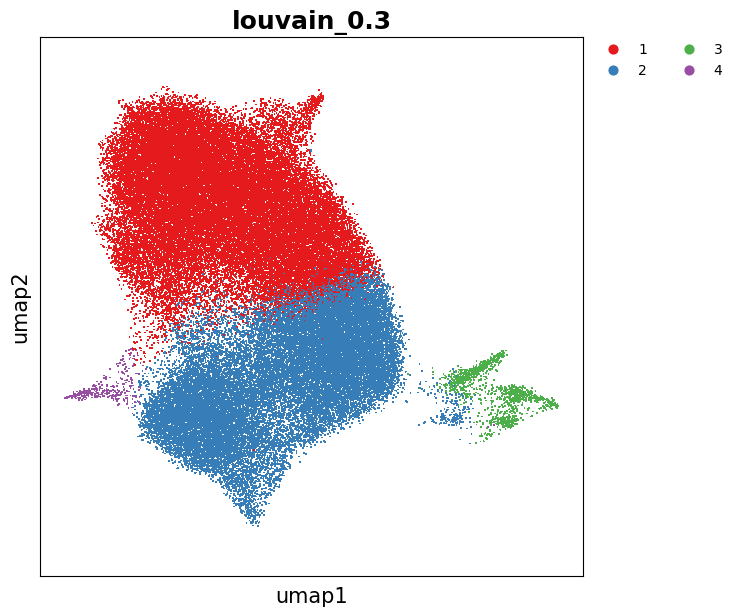

In [10]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain_0.3', resolution=0.3)
data.plt.cluster_scatter(res_key='louvain_0.3')
data.plt.umap(res_key='umap', cluster_key='louvain_0.3')

[2023-02-03 14:02:42][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run louvain...
[2023-02-03 14:02:43][Stereo][57183][140316455438144][_louvain][99][INFO]:     using the "louvain" package of Traag (2017)
[2023-02-03 14:02:52][Stereo][57183][140316455438144][st_pipeline][43][INFO]: louvain end, consume time 10.1277s.


<AxesSubplot:title={'center':'louvain_0.8'}, xlabel='umap1', ylabel='umap2'>

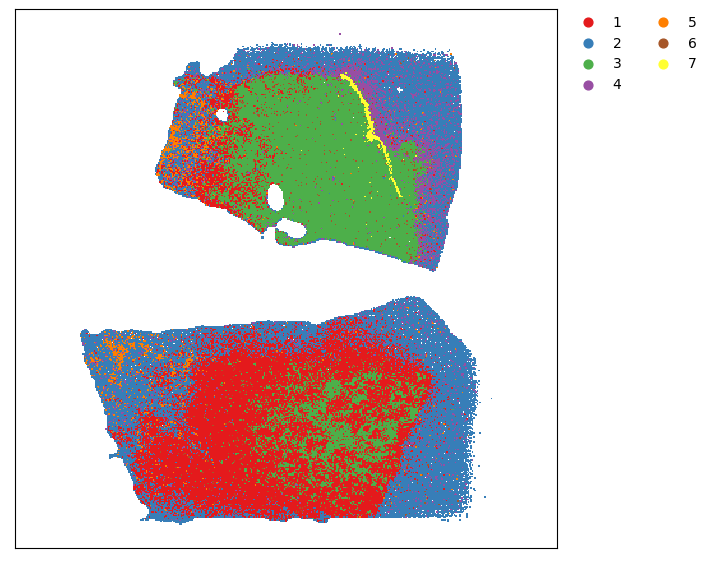

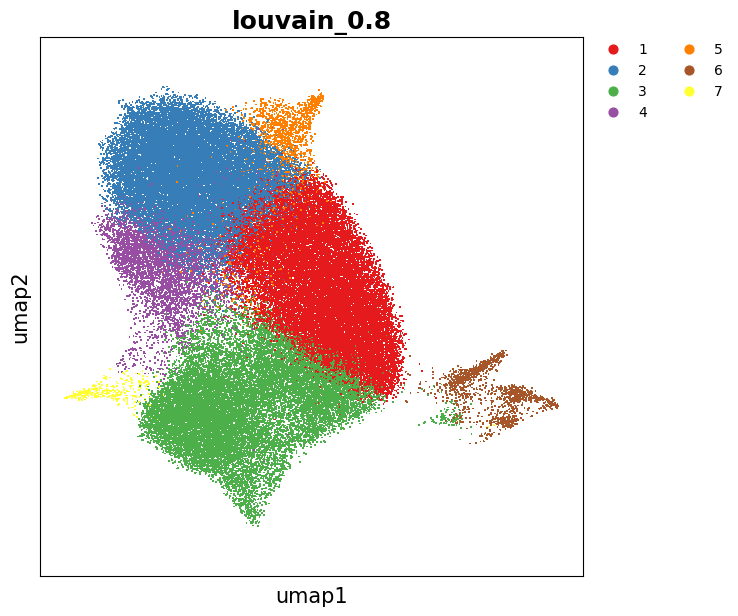

In [11]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain_0.8', resolution=0.8)
data.plt.cluster_scatter(res_key='louvain_0.8')
data.plt.umap(res_key='umap', cluster_key='louvain_0.8')

[2023-02-03 14:02:54][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run leiden...
[2023-02-03 14:03:13][Stereo][57183][140316455438144][st_pipeline][43][INFO]: leiden end, consume time 19.6704s.


<AxesSubplot:title={'center':'leiden_0.2'}, xlabel='umap1', ylabel='umap2'>

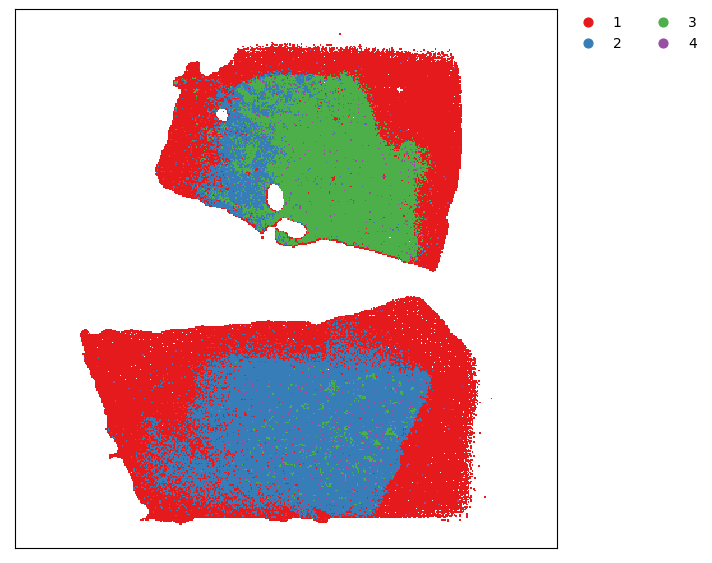

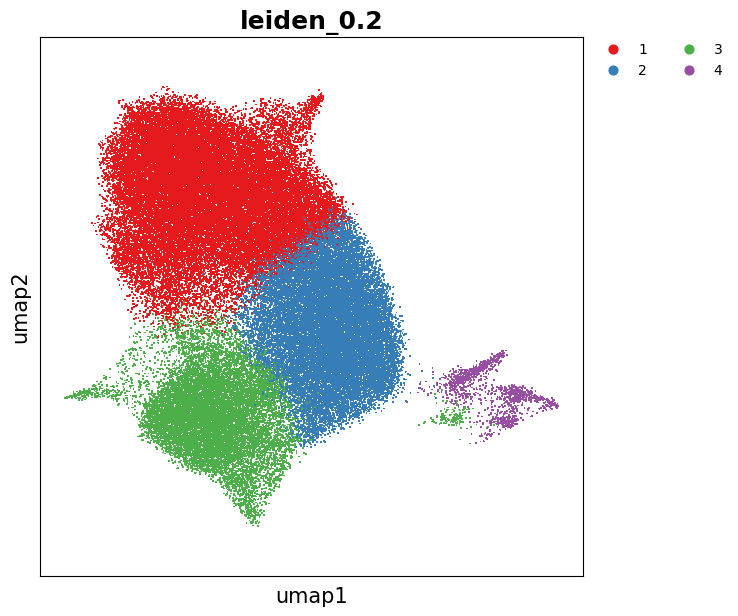

In [12]:
data.tl.leiden(neighbors_res_key='neighbors', res_key='leiden_0.2', resolution=0.2)
data.plt.cluster_scatter(res_key='leiden_0.2')
data.plt.umap(res_key='umap', cluster_key='leiden_0.2')

[2023-02-03 14:03:15][Stereo][57183][140316455438144][st_pipeline][40][INFO]: start to run leiden...
[2023-02-03 14:03:37][Stereo][57183][140316455438144][st_pipeline][43][INFO]: leiden end, consume time 22.0463s.


<AxesSubplot:title={'center':'leiden_0.6'}, xlabel='umap1', ylabel='umap2'>

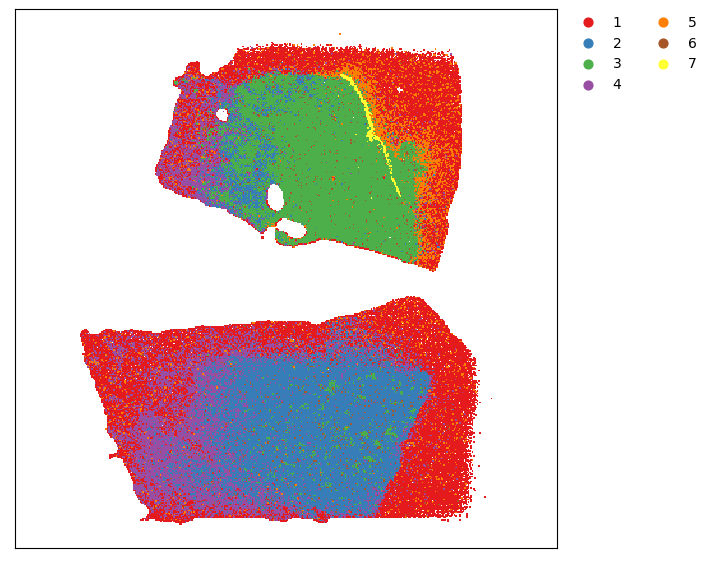

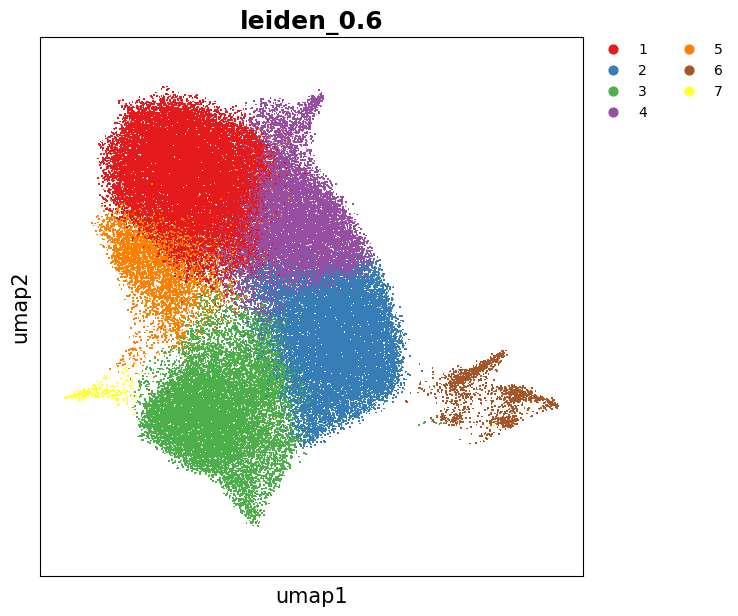

In [13]:
data.tl.leiden(neighbors_res_key='neighbors', res_key='leiden_0.6', resolution=0.6)
data.plt.cluster_scatter(res_key='leiden_0.6')
data.plt.umap(res_key='umap', cluster_key='leiden_0.6')

In [14]:
outkey_record = {'cluster':['leiden_0.2','leiden_0.6','louvain_0.3','louvain_0.8'],}
st.io.write_h5ad(data, use_raw=True, use_result=True, key_record=outkey_record, output='./952BR_B4.bin50.h5ad')

[2023-02-03 14:03:38][Stereo][57183][140316455438144][data][72][WARNING]: the output file is exists, we will replace it with new file.


In [50]:
#data.tl.phenograph(phenograph_k=30, pca_res_key='pca', res_key='phenograph')
#data.plt.cluster_scatter(res_key='phenograph')
#data.plt.umap(res_key='umap', cluster_key='phenograph')

In [51]:
# data.tl.gaussian_smooth(n_neighbors=10, smooth_threshold=90 inplace=False, res_key="gs")
# data.tl.scale(max_value=10) #only for gaussian_smooth_scatter_by_gene

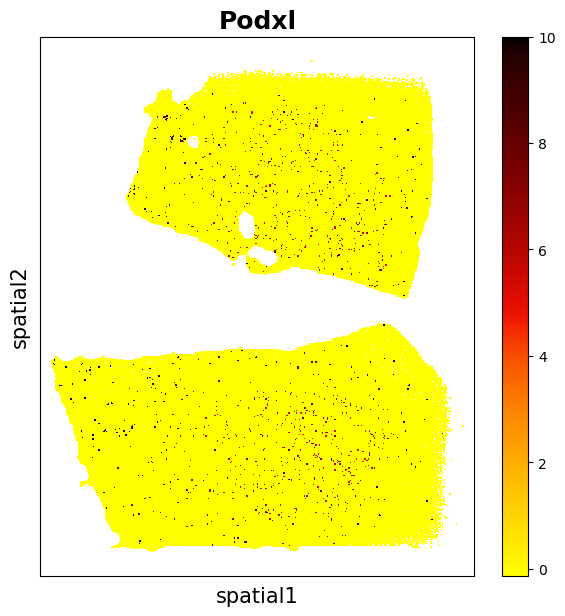

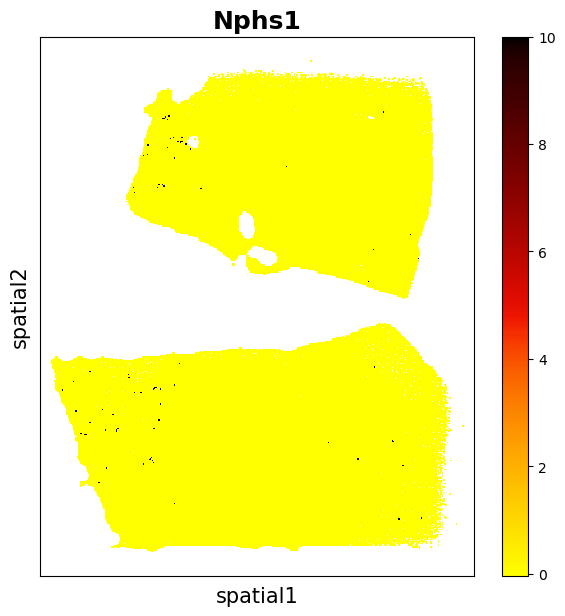

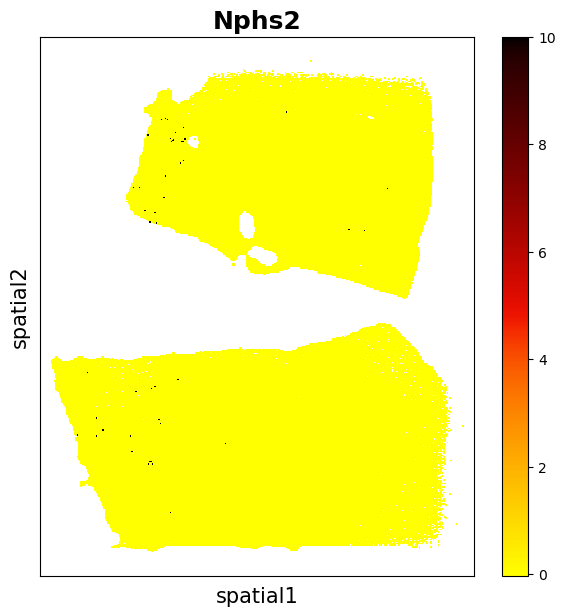

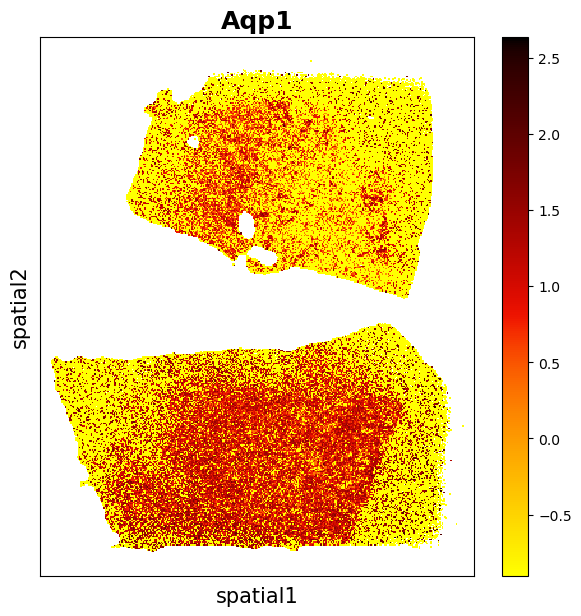

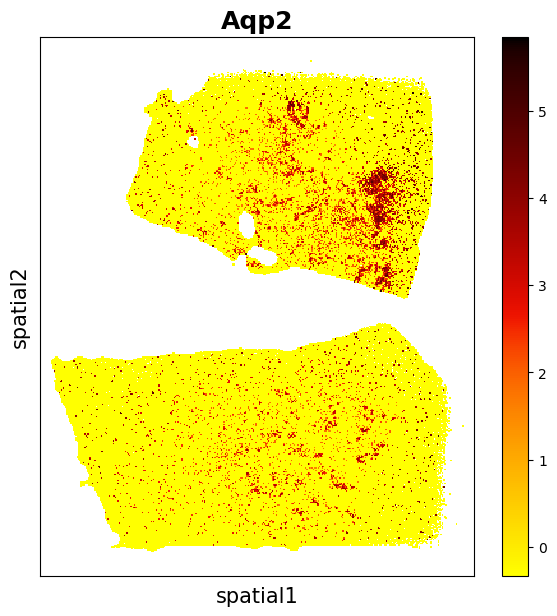

...

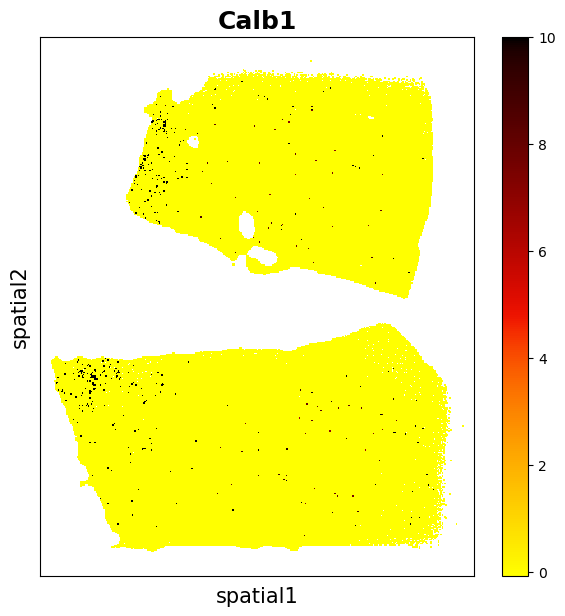

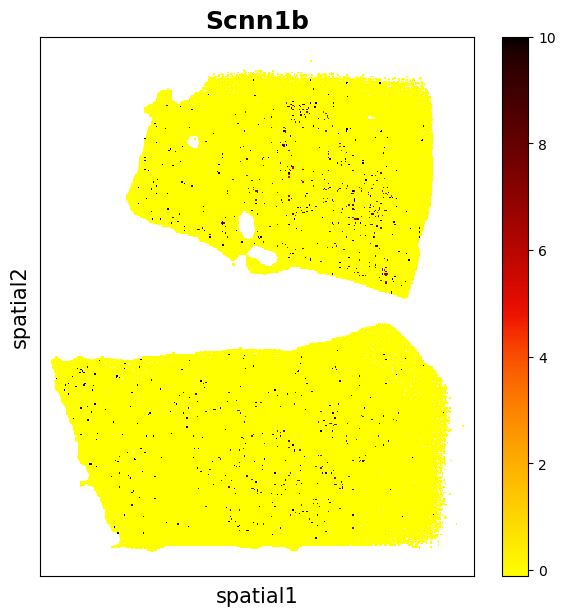

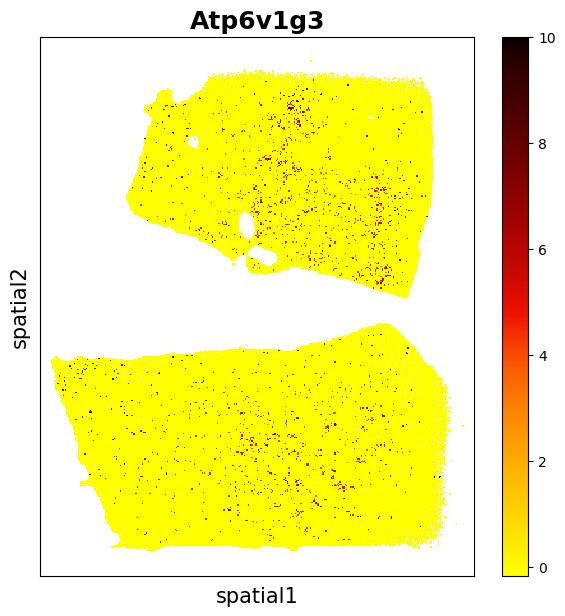

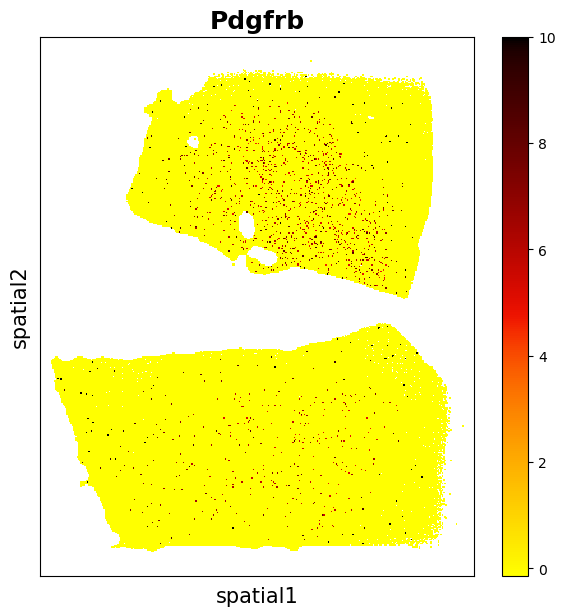

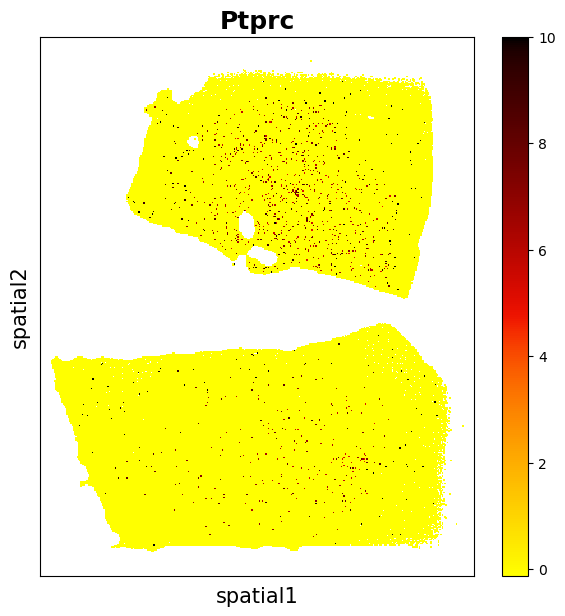

In [20]:
data.plt.spatial_scatter_by_gene(gene_name='Podxl')
data.plt.spatial_scatter_by_gene(gene_name='Nphs1')
data.plt.spatial_scatter_by_gene(gene_name='Nphs2')

data.plt.spatial_scatter_by_gene(gene_name='Aqp1')
data.plt.spatial_scatter_by_gene(gene_name='Aqp2')
data.plt.spatial_scatter_by_gene(gene_name='Slc12a1')
data.plt.spatial_scatter_by_gene(gene_name='Slc12a3')
# data.plt.spatial_scatter_by_gene(gene_name='Slc14a2')
data.plt.spatial_scatter_by_gene(gene_name='Slc22a6')
data.plt.spatial_scatter_by_gene(gene_name='Slc34a1')
data.plt.spatial_scatter_by_gene(gene_name='Slc4a1')

data.plt.spatial_scatter_by_gene(gene_name='Umod')
data.plt.spatial_scatter_by_gene(gene_name='Scnn1g')
data.plt.spatial_scatter_by_gene(gene_name='Plvap')
data.plt.spatial_scatter_by_gene(gene_name='Slc14a1')
data.plt.spatial_scatter_by_gene(gene_name='Vwf')

data.plt.spatial_scatter_by_gene(gene_name='Hnf4a')
data.plt.spatial_scatter_by_gene(gene_name='Slc5a12')
data.plt.spatial_scatter_by_gene(gene_name='Slc7a13')
data.plt.spatial_scatter_by_gene(gene_name='Havcr1')
data.plt.spatial_scatter_by_gene(gene_name='Mki67')
data.plt.spatial_scatter_by_gene(gene_name='Calb1')
data.plt.spatial_scatter_by_gene(gene_name='Scnn1b')
data.plt.spatial_scatter_by_gene(gene_name='Atp6v1g3')
# data.plt.spatial_scatter_by_gene(gene_name='Flt1')
data.plt.spatial_scatter_by_gene(gene_name='Pdgfrb')
data.plt.spatial_scatter_by_gene(gene_name='Ptprc')

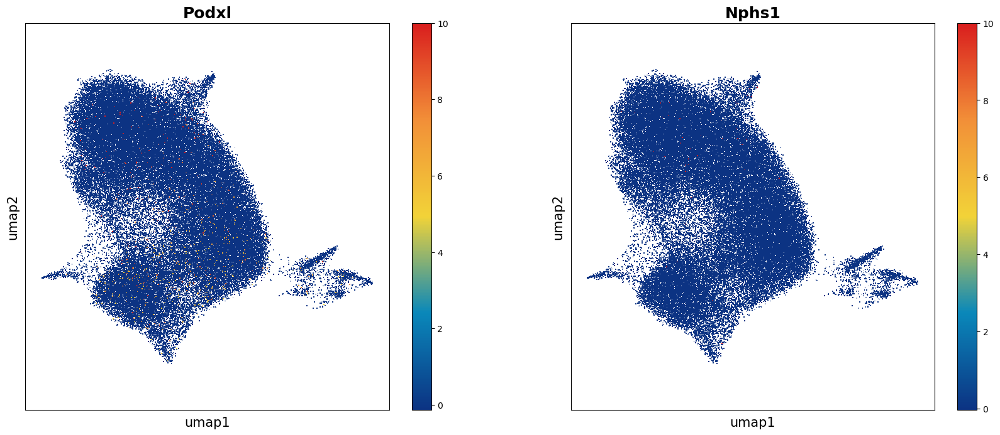

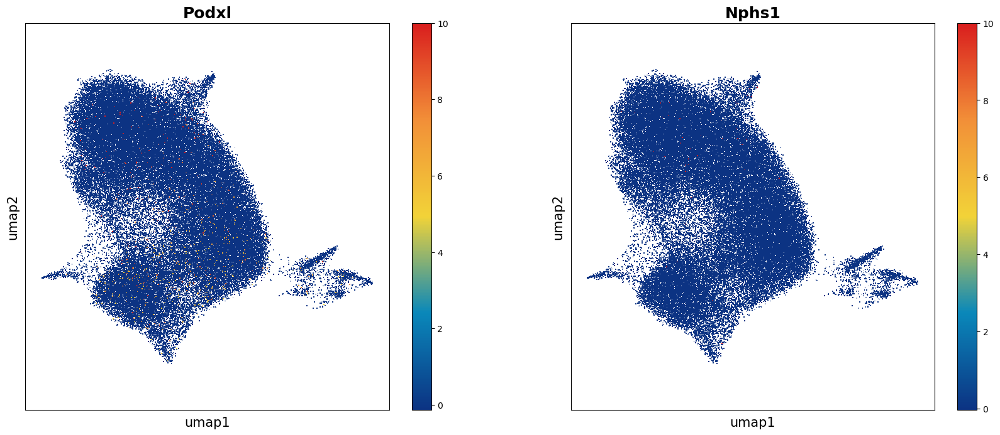

In [17]:
data.plt.umap(gene_names=['Podxl', 'Nphs1'], res_key='umap')

In [18]:
data.tl.find_marker_genes(cluster_res_key='louvain_0.3', method='t_test', use_highly_genes=False, use_raw=False, hvg_res_key="hvg_nt", 
                          res_key='marker_louvain_0.3', output="marker_gene/952BR_B4.louvain_0.3.marker_gene.csv")
data.tl.find_marker_genes(cluster_res_key='louvain_0.8', method='t_test', use_highly_genes=False, use_raw=False, hvg_res_key="hvg_nt", 
                          res_key='marker_louvain_0.8', output="marker_gene/952BR_B4.louvain_0.8.marker_gene.csv")
data.tl.find_marker_genes(cluster_res_key='leiden_0.2', method='t_test', use_highly_genes=False, use_raw=False, hvg_res_key="hvg_nt", 
                          res_key='marker_leiden_0.2', output="marker_gene/952BR_B4.leiden_0.2.marker_gene.csv")
data.tl.find_marker_genes(cluster_res_key='leiden_0.6', method='t_test', use_highly_genes=False, use_raw=False, hvg_res_key="hvg_nt", 
                          res_key='marker_leiden_0.6', output="marker_gene/952BR_B4.leiden_0.6.marker_gene.csv")

[2023-01-31 14:31:53][Stereo][227653][140053144606528][st_pipeline][40][INFO]: start to run find_marker_genes...
[2023-01-31 14:31:53][Stereo][227653][140053144606528][tool_base][117][INFO]: read group information, grouping by group column.
[2023-01-31 14:31:53][Stereo][227653][140053144606528][tool_base][155][INFO]: start to run...
Find marker gene:   0%|          | 0/5 [00:00<?, ?it/s][2023-01-31 14:31:53][Stereo][227653][140053144606528][find_markers][119][INFO]: start to select group
[2023-01-31 14:31:55][Stereo][227653][140053144606528][find_markers][122][INFO]: end selelct group
Find marker gene:  20%|██        | 1/5 [00:05<00:20,  5.23s/it][2023-01-31 14:31:58][Stereo][227653][140053144606528][find_markers][119][INFO]: start to select group
[2023-01-31 14:32:00][Stereo][227653][140053144606528][find_markers][122][INFO]: end selelct group
Find marker gene:  40%|████      | 2/5 [00:10<00:15,  5.23s/it][2023-01-31 14:32:03][Stereo][227653][140053144606528][find_markers][119][INFO]:

Find marker gene:  75%|███████▌  | 6/8 [00:31<00:10,  5.25s/it][2023-01-31 14:33:55][Stereo][227653][140053144606528][find_markers][119][INFO]: start to select group
[2023-01-31 14:33:57][Stereo][227653][140053144606528][find_markers][122][INFO]: end selelct group
Find marker gene:  88%|████████▊ | 7/8 [00:36<00:05,  5.24s/it][2023-01-31 14:34:00][Stereo][227653][140053144606528][find_markers][119][INFO]: start to select group
[2023-01-31 14:34:02][Stereo][227653][140053144606528][find_markers][122][INFO]: end selelct group
Find marker gene: 100%|██████████| 8/8 [00:42<00:00,  5.25s/it]
[2023-01-31 14:34:05][Stereo][227653][140053144606528][tool_base][157][INFO]: end to run.
[2023-01-31 14:34:06][Stereo][227653][140053144606528][st_pipeline][43][INFO]: find_marker_genes end, consume time 42.5761s.


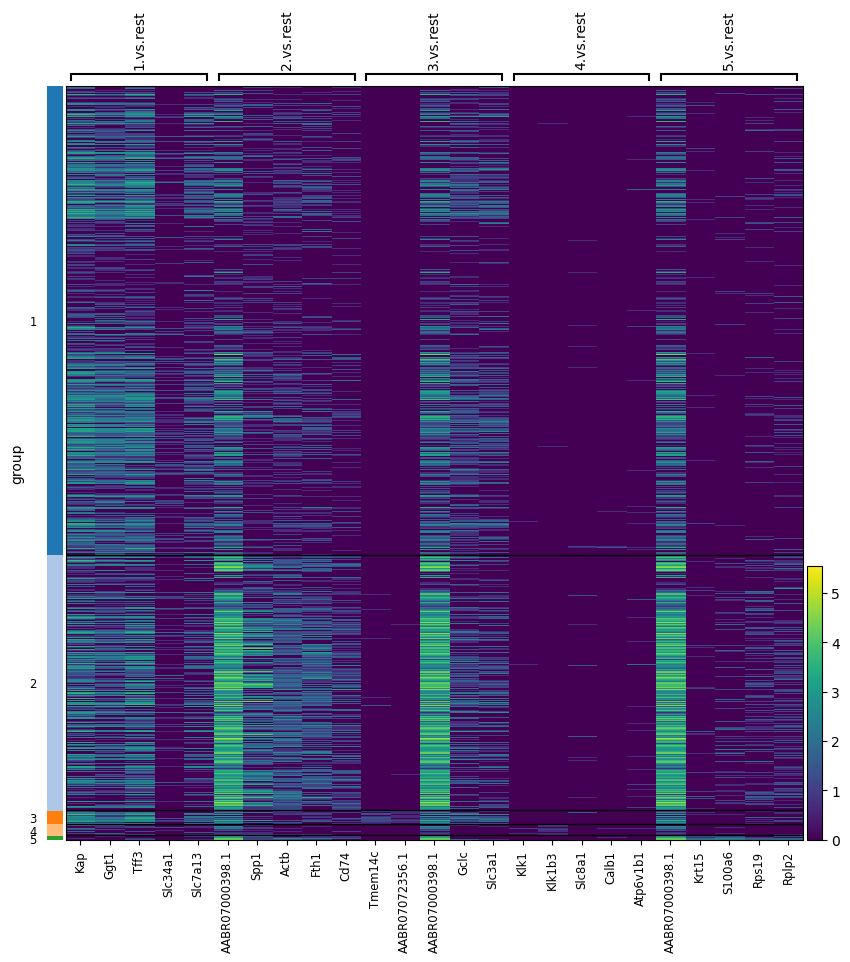

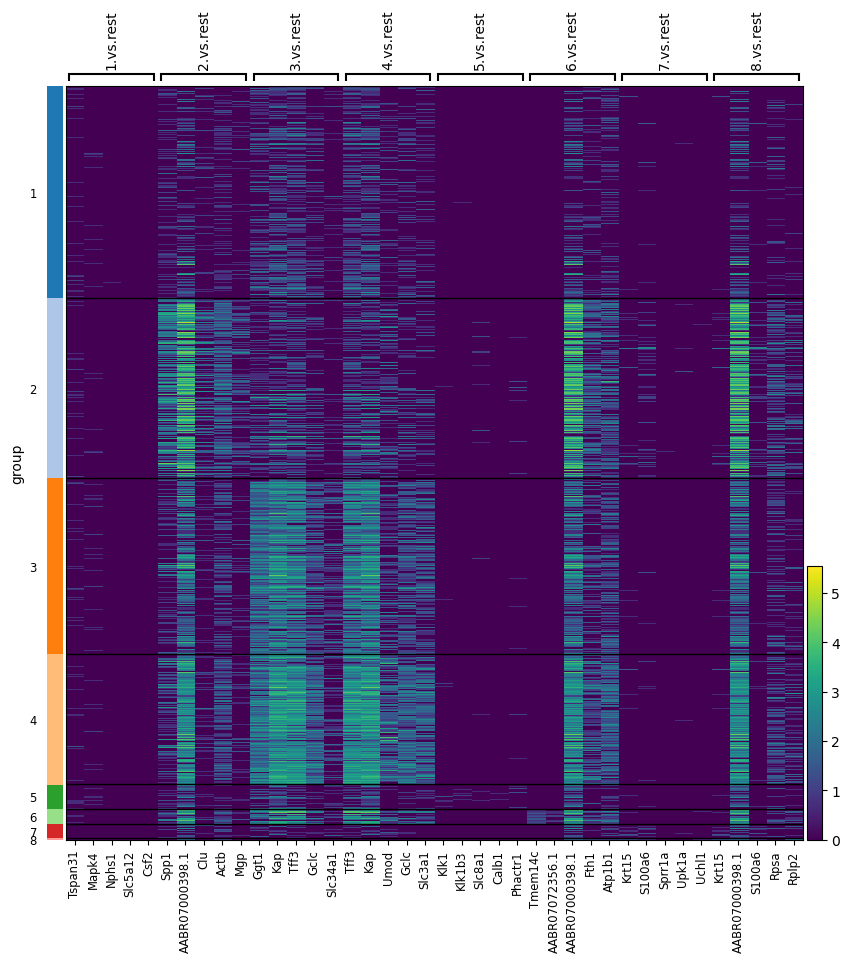

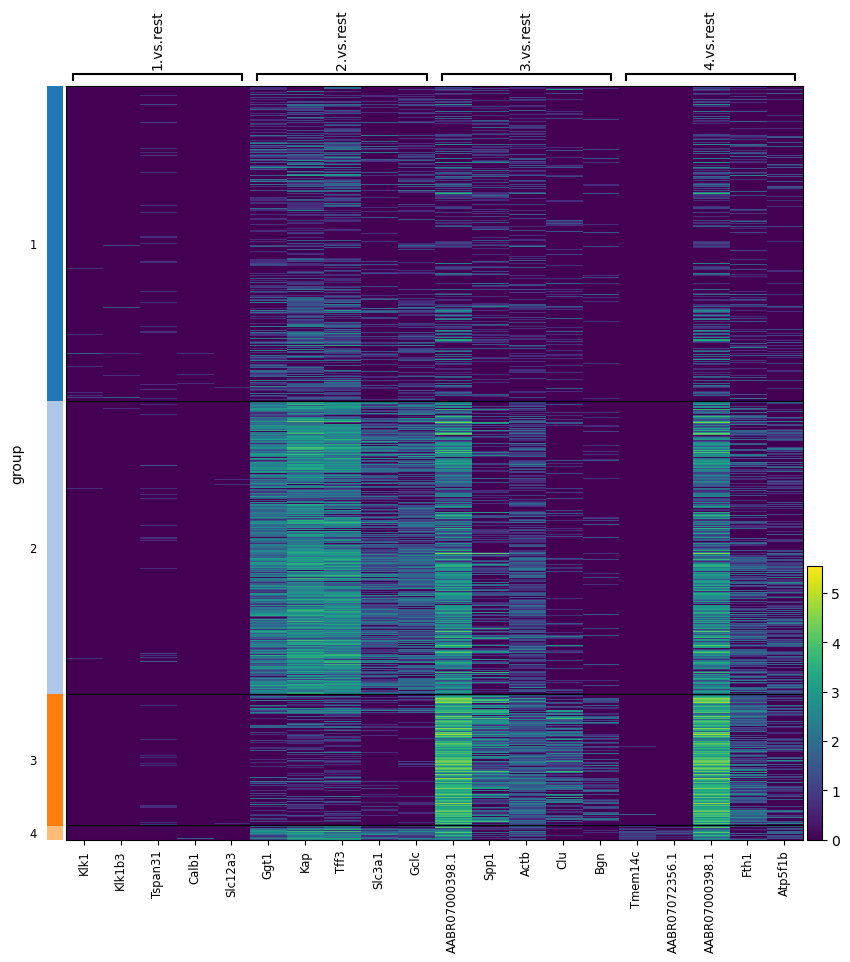

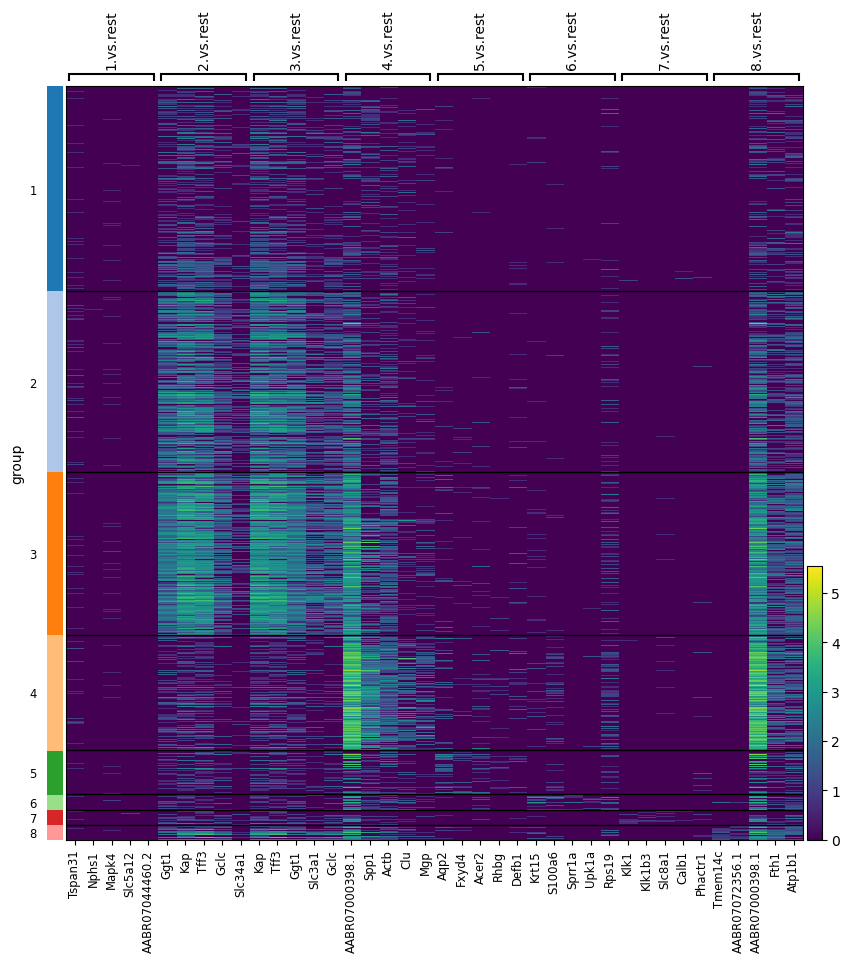

In [19]:
data.plt.marker_genes_heatmap(res_key='marker_louvain_0.3', cluster_res_key='louvain_0.3', markers_num=5, do_log=True)
data.plt.marker_genes_heatmap(res_key='marker_louvain_0.8', cluster_res_key='louvain_0.8', markers_num=5, do_log=True)
data.plt.marker_genes_heatmap(res_key='marker_leiden_0.2', cluster_res_key='leiden_0.2', markers_num=5, do_log=True)
data.plt.marker_genes_heatmap(res_key='marker_leiden_0.6', cluster_res_key='leiden_0.6', markers_num=5, do_log=True)

In [43]:
marker_list = ['Nphs1', 'Ncam1', 'Slc34a1', 'Slc7a12', 
                'Havcr1', 'Fst', 'Atp10b', 'Slc12a1', 'Nos1',
                'Slc12a3', 'Slc8a1', 'Aqp2', 'Kit', 'Slc26a4',
                'Flt1', 'Ren1', 'Ptprc']
marker_list_use = [i for i in marker_list if i in data.gene_names]

fig = data.plt.umap(gene_names=marker_list_use, res_key='umap')

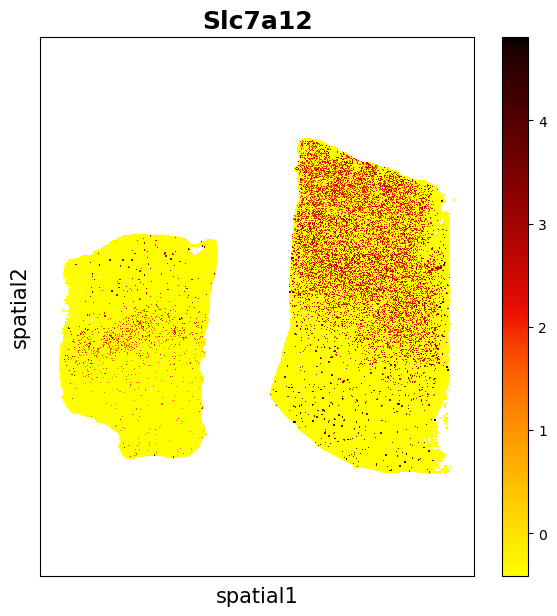

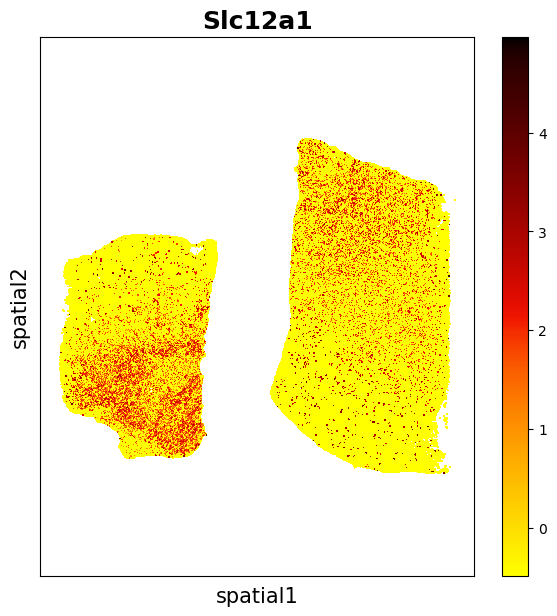

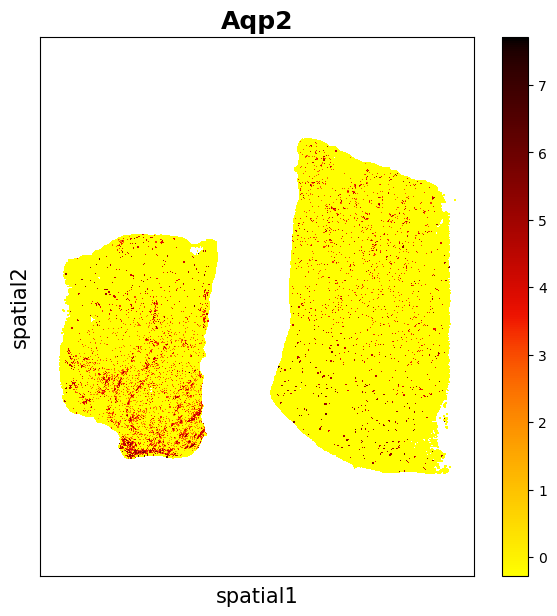

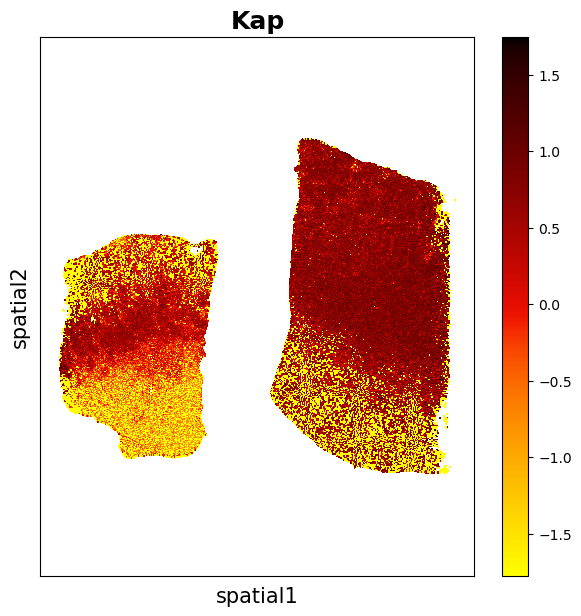

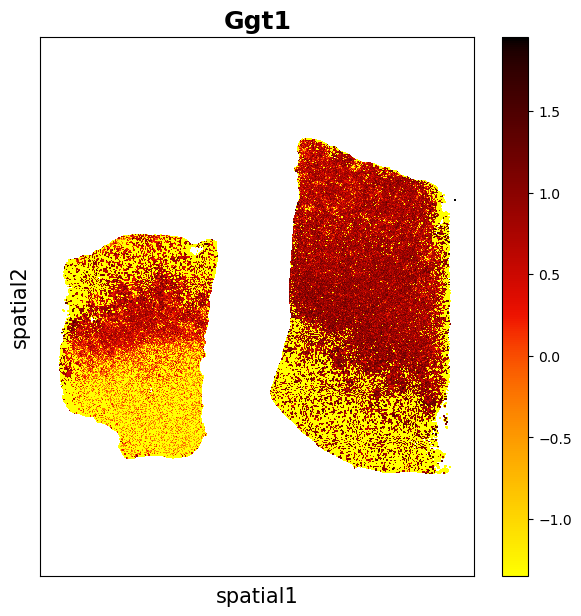

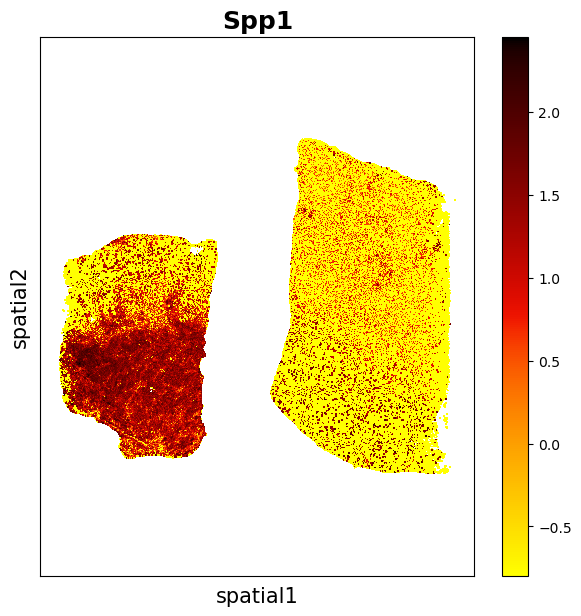

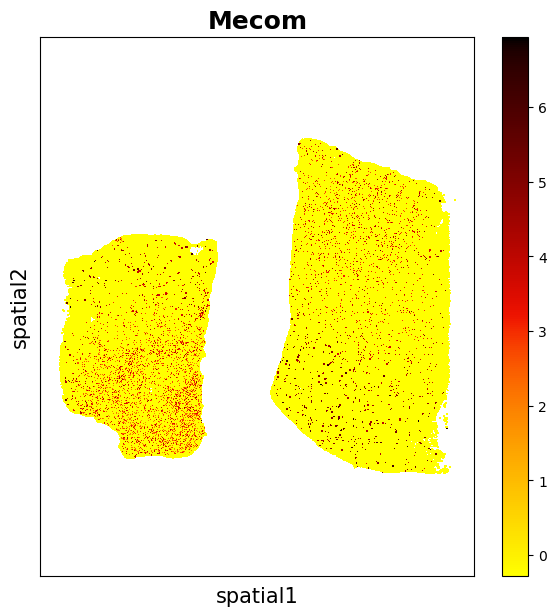

In [56]:
data.plt.spatial_scatter_by_gene(gene_name='Slc7a12')
data.plt.spatial_scatter_by_gene(gene_name='Slc12a1')
data.plt.spatial_scatter_by_gene(gene_name='Aqp2')
data.plt.spatial_scatter_by_gene(gene_name='Kap')
data.plt.spatial_scatter_by_gene(gene_name='Ggt1')
data.plt.spatial_scatter_by_gene(gene_name='Spp1')
data.plt.spatial_scatter_by_gene(gene_name='Mecom')